<div class="alert alert-danger">

<h1>Take notice!</h1>
<ul>
    <li>Make sure you are working with a copy and not the original notebook file</li>
    <li>This class will be recorded</li>
</ul>
    
</div>

# Multiple Overlays with Folium

In last week's Multiple Overlay lab, the final output was a static geopandas map. In this lab, we take a similar approach to generate a multi-layered map, but use Folium to make the output interactive.

- import census data on educational attainment
- import arrests data from the LA Data Portal
- use Folium to map both layers
- use a marker cluster plugin to handle thousands of markers


<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Take-notice!" data-toc-modified-id="Take-notice!-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Take notice!</a></span></li><li><span><a href="#Multiple-Overlays-with-Folium" data-toc-modified-id="Multiple-Overlays-with-Folium-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Multiple Overlays with Folium</a></span><ul class="toc-item"><li><span><a href="#Import-the-libraries" data-toc-modified-id="Import-the-libraries-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Import the libraries</a></span></li><li><span><a href="#Census-Data" data-toc-modified-id="Census-Data-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Census Data</a></span></li><li><span><a href="#Cleaning-up-those-columns" data-toc-modified-id="Cleaning-up-those-columns-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Cleaning up those columns</a></span></li><li><span><a href="#Arrests-data-from-the-LA-Data-Portal" data-toc-modified-id="Arrests-data-from-the-LA-Data-Portal-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Arrests data from the LA Data Portal</a></span></li><li><span><a href="#Get-the-center-of-the-data" data-toc-modified-id="Get-the-center-of-the-data-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>Get the center of the data</a></span></li><li><span><a href="#Create-a-folium-map" data-toc-modified-id="Create-a-folium-map-2.6"><span class="toc-item-num">2.6&nbsp;&nbsp;</span>Create a folium map</a></span></li><li><span><a href="#First-layer:-Cluster-marker-of-crime-data" data-toc-modified-id="First-layer:-Cluster-marker-of-crime-data-2.7"><span class="toc-item-num">2.7&nbsp;&nbsp;</span>First layer: Cluster marker of crime data</a></span></li><li><span><a href="#Second-layer:-choropleth-of-census-data" data-toc-modified-id="Second-layer:-choropleth-of-census-data-2.8"><span class="toc-item-num">2.8&nbsp;&nbsp;</span>Second layer: choropleth of census data</a></span></li><li><span><a href="#Save-the-html-file" data-toc-modified-id="Save-the-html-file-2.9"><span class="toc-item-num">2.9&nbsp;&nbsp;</span>Save the html file</a></span></li></ul></li></ul></div>

## Import the libraries

In [1]:
# to read and wrangle data
import pandas as pd

# to import data from LA Data portal
from sodapy import Socrata

# to create spatial data
import geopandas as gpd

# for basemaps
import contextily as ctx

# for interactive leaflet mapping
import folium

# to handle thousands of markers
from folium.plugins import MarkerCluster

## Census Data

For this lab, we get the census data from [Census Reporter](https://censusreporter.org/) which provides the data in geojson format.

In [2]:
acs_education = gpd.read_file('data/acs2018_5yr_B15003_14000US06037218220.geojson')

<div class="alert alert-danger">
Warning!
    
The geojson data downloaded from Census Reporter contains a row with the sum total of all geographies. Make sure to find and delete the row before proceding.
</div>

In [3]:
# where is the sum total row?
acs_education.tail()

,geoid,name,B15003001,"B15003001, Error",B15003002,"B15003002, Error",B15003003,"B15003003, Error",B15003004,"B15003004, Error",...,"B15003021, Error",B15003022,"B15003022, Error",B15003023,"B15003023, Error",B15003024,"B15003024, Error",B15003025,"B15003025, Error",geometry
1000,14000US06037980026,"Census Tract 9800.26, Los Angeles, CA",17.0,13.0,0.0,12.0,0.0,12.0,0.0,12.0,...,12.0,4.0,6.0,8.0,7.0,0.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
1001,14000US06037980028,"Census Tract 9800.28, Los Angeles, CA",0.0,12.0,0.0,12.0,0.0,12.0,0.0,12.0,...,12.0,0.0,12.0,0.0,12.0,0.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
1002,14000US06037980031,"Census Tract 9800.31, Los Angeles, CA",1025.0,132.0,9.0,17.0,0.0,12.0,0.0,12.0,...,39.0,129.0,77.0,12.0,21.0,16.0,22.0,11.0,19.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
1003,14000US06037990200,"Census Tract 9902, Los Angeles, CA",0.0,12.0,0.0,12.0,0.0,12.0,0.0,12.0,...,12.0,0.0,12.0,0.0,12.0,0.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."
1004,16000US0644000,"Los Angeles, CA",2712615.0,4633.0,91079.0,2515.0,805.0,173.0,1257.0,256.0,...,2646.0,598869.0,5575.0,203891.0,3051.0,74495.0,1986.0,37065.0,1134.0,"MULTIPOLYGON (((-118.66818 34.18987, -118.6681..."


In [4]:
# last row is the total for the county so drop it
acs_education=acs_education.drop([1004])

## Cleaning up those columns

The downloaded zip from census explorer comes with a metadata json file. Open it and inspect its contents.

[meta data](data/metadata.json)

In [5]:
# trim to columns of interest
acs_education = acs_education[['geoid','geometry','B15003001','B15003017','B15003022','B15003023','B15003025',]]

In [6]:
# rename columns
acs_education.columns = ['geoid','geometry','Total',"Regular high school diploma","Bachelor's degree","Master's degree","Doctorate degree"]

In [7]:
acs_education.head()

,geoid,geometry,Total,Regular high school diploma,Bachelor's degree,Master's degree,Doctorate degree
0,14000US06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",3085.0,719.0,411.0,180.0,54.0
1,14000US06037101122,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033...",2597.0,697.0,463.0,248.0,68.0
2,14000US06037101210,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",4107.0,1107.0,548.0,174.0,62.0
3,14000US06037101220,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859...",2484.0,656.0,347.0,129.0,24.0
4,14000US06037101300,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782...",3446.0,902.0,604.0,278.0,26.0


In [8]:
# get some simple stats
acs_education["Regular high school diploma"].describe()

count    1004.000000
mean      482.522908
std       254.929491
min         0.000000
25%       306.000000
50%       449.500000
75%       630.000000
max      1463.000000
Name: Regular high school diploma, dtype: float64

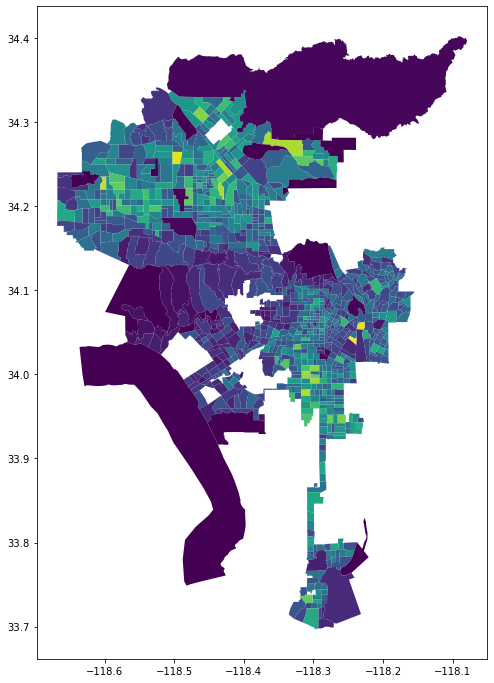

In [9]:
# make a quick plot
acs_education.plot(figsize=(12,12),column="Regular high school diploma")

## Arrests data from the LA Data Portal

- https://data.lacity.org/A-Safe-City/Arrest-Data-from-2020-to-Present/amvf-fr72

In [10]:
# connect to the data portal
client = Socrata("data.lacity.org", None)

results = client.get("amvf-fr72", 
                     limit=5000,
                     where = "arst_date between '2020-09-01T00:00:00' and '2020-09-30T00:00:00'",
                     order='arst_date desc')


# Convert to pandas DataFrame
df = pd.DataFrame.from_records(results)

# print it with .sample, which gives you random rows
df.head()

,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,sex_cd,descent_cd,...,dispo_desc,location,lat,lon,location_1,bkg_date,bkg_time,bgk_location,bkg_loc_cd,crsst
0,6019649,BOOKING,2020-09-26T00:00:00.000,1340,02,Rampart,0269,29,M,B,...,MISDEMEANOR COMPLAINT FILED,1200 W 7TH ST,34.0515,-118.2658,"{'type': 'Point', 'coordinates': [-118.2658, 3...",2020-09-26T00:00:00.000,1612,METRO - JAIL DIVISION,4273,NaN
1,6019527,BOOKING,2020-09-26T00:00:00.000,0615,14,Pacific,1494,26,M,B,...,NaN,400 WORLD WAY WY,33.942,-118.4095,"{'type': 'Point', 'coordinates': [-118.4095, 3...",2020-09-26T00:00:00.000,0819,PACIFIC,4214,NaN
2,6019650,BOOKING,2020-09-26T00:00:00.000,1250,07,Wilshire,0702,53,M,W,...,NaN,SIERRA BONITA,34.0837,-118.3543,"{'type': 'Point', 'coordinates': [-118.3543, 3...",2020-09-26T00:00:00.000,1612,METRO - JAIL DIVISION,4273,MELROSE
3,6019578,BOOKING,2020-09-26T00:00:00.000,0920,15,N Hollywood,1531,41,M,H,...,MISDEMEANOR COMPLAINT FILED,WHITSETT,34.1758,-118.4052,"{'type': 'Point', 'coordinates': [-118.4052, 3...",2020-09-26T00:00:00.000,1120,VALLEY - JAIL DIV,4279,HATTERAS
4,6019399,BOOKING,2020-09-26T00:00:00.000,0105,01,Central,0163,19,M,W,...,MISDEMEANOR COMPLAINT FILED,9TH,34.043,-118.2571,"{'type': 'Point', 'coordinates': [-118.2571, 3...",2020-09-26T00:00:00.000,0225,METRO - JAIL DIVISION,4273,HILL


In [11]:
# convert pandas dataframe to geodataframe
arrests = gpd.GeoDataFrame(df, 
                         crs='EPSG:4326',
                         geometry=gpd.points_from_xy(df.lon, df.lat))

In [12]:
arrests.shape

(4360, 26)

In [13]:
arrests.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4360 entries, 0 to 4359
Data columns (total 26 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   rpt_id           4360 non-null   object  
 1   report_type      4360 non-null   object  
 2   arst_date        4360 non-null   object  
 3   time             4360 non-null   object  
 4   area             4360 non-null   object  
 5   area_desc        4360 non-null   object  
 6   rd               4360 non-null   object  
 7   age              4360 non-null   object  
 8   sex_cd           4360 non-null   object  
 9   descent_cd       4360 non-null   object  
 10  chrg_grp_cd      4023 non-null   object  
 11  grp_description  4023 non-null   object  
 12  arst_typ_cd      4360 non-null   object  
 13  charge           4360 non-null   object  
 14  chrg_desc        4026 non-null   object  
 15  dispo_desc       3552 non-null   object  
 16  location         4360 non-null   o

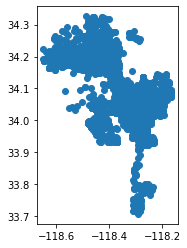

In [14]:
arrests.plot()

## Get the center of the data

Folium maps need to be fed a center location. Calculate that based on the crime data.

In [15]:
# get the bounding box coordinates
minx, miny, maxx, maxy = arrests.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)


-118.6497
-118.1645
33.707
34.3261


In [16]:
# get center lon
center_lon = (maxx-minx)/2+minx
center_lon

-118.4071

In [17]:
# get center lat
center_lat = (maxy-miny)/2+miny
center_lat

34.016549999999995

## Create a folium map

Now we put all the pieces together. 

In [18]:
# folium map centered based on the arrest data
m = folium.Map(location=[center_lat, center_lon],tiles='cartodbpositron',)

## First layer: Cluster marker of crime data

The crime data downloaded has thousands of records. Mapping them one by one will overwhelm your browser. Fortunately, there is a handy leaflet [plugin to cluster markers](https://python-visualization.github.io/folium/plugins.html), allowing you to map all the data at once.

In [19]:
# m = folium.Map(location=[center_lat, center_lon],tiles='cartodbpositron',)
# create an empty marker cluster layer
marker_cluster = MarkerCluster(name='LAPD Arrests in September, 2020').add_to(m)

# loop through the arrest data and add each row as a marker to the marker cluster
for index, row in arrests.iterrows():

    popup = '<strong>'+str(row.grp_description)+'</strong><hr>'+'Age: '+str(row.age)+'<br>Sex: '+str(row.sex_cd)+'<br>Race: '+str(row.descent_cd)
    folium.Marker(
        location=[row.lat,row.lon],
        tooltip=row.grp_description,
        popup= popup,
        icon=folium.Icon(color='red')
    ).add_to(marker_cluster)

m

## Second layer: choropleth of census data

In [20]:
# choropleth map of educational attainment
folium.Choropleth(
    acs_education, # the geodataframe
    data=acs_education, # the data is in the geodataframe, so same value
    key_on='feature.properties.geoid', # the id column
    columns=['geoid', "Regular high school diploma"], # the id column, followed by the variable to map
    fill_color='RdYlGn_r', # color scheme
    fill_opacity=0.4, 
    line_opacity=0.1, 
    legend_name="Regular high school diploma (ACS 2018 5-year)",
    name="Regular high school diploma (ACS 2018 5-year)" # name the layer
).add_to(m)

# add a nice layer control
folium.LayerControl().add_to(m)

# output the map
m

## Save the html file

In [ ]:
m.save('crime_education.html')